In [ ]:
using Pkg
Pkg.activate("C:/Users/lisah/Documents/Repos/ma-code")
include("c:/Users/lisah/Documents/Repos/ma-code/src/src.jl")
using .Src, Plots

  Activating project at `C:\Users\lisah\Documents\Repos\ma-code`


# Practical Identifiability Analysis

This script tests the functionality of the code related to the practical identifiability analysis by executing some examples and different test cases.

## Notes on usage

The following fields can be set:
- `prm_keys::Vector{Symbol}`: contains the name of the parameter(s) which are treated as unknown (for example `prm_keys=[:a]`)
- `t_fixed::Bool`: true if we consider a fixed observation time window
- `t_end::Float64`: end of observation window (if `t_fixed=true`)
- `t_step::Float64`: step size with which M observations should be picked (set if `t_fixed=false`)
- `hprm::Hyperprm`: all the parameters needed for model simulation of the data observations, i.e.
    - `w0`: initial value for water compartment
    - `n0`: initialvalue for biomass compartment
    - `a`: water input model parameter
    - `m`: plant mortality parameter
    - `M`: sample size (number of measurements)
    - `noise`: noise level (Gaussian variance) of the data

Inverse problem only:
- `obs_late::Bool`: Set to true if we only consider observations taken in the stable state
- `t_obs::Float64`: The time at which late observations are taken if `obs_late=true`

Forward problem only:
- `mle`, `cov`: parameters of Gaussian approximation
- `t_pt_sample_dens`: time point at which sample density shall be computed
- `n`: samples drawn from posterior

Inverse probem: Returned is a tuple with the fields `mle, plot_mles, plot_losses, cor, cov, gaussian_heatmap, gaussian_surface`.
If a field is not defined in the univariate case it returns `nothing`.

Forward problem: Returned is a tuple with the fields `trajectories, sample_dens_n, sample_dens_w`

## Infer single parameter

In [2]:
# determine which parameter is inferred
a_true = 1.5
prm_keys = [:a]

# further settings
t_fixed = true
hprm = Hyperprm(1.0, 1.0, a_true, 0.45, 100, 0.1)

Hyperprm(1.0, 1.0, 1.5, 0.45, 100, 0.1)

In [13]:
result_infer_a = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)
fwd_uq_a = forward_uq(result_infer_a.mle, result_infer_a.cov, prm_keys, [a_true], hprm, t_fixed=t_fixed)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

In [14]:
result_infer_a.mle, result_infer_a.cov

([1.496315810509552], [0.00016560799868404235;;])

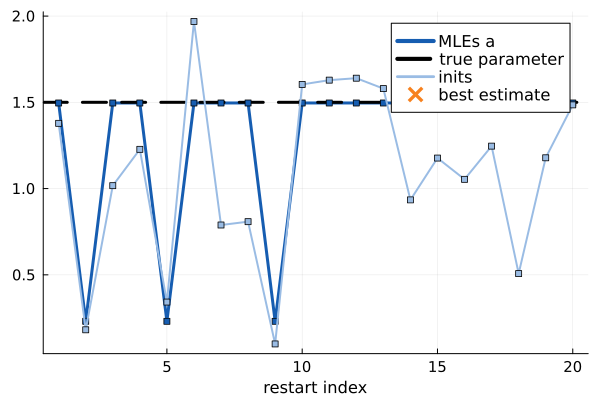

In [15]:
result_infer_a.plot_mles[1]

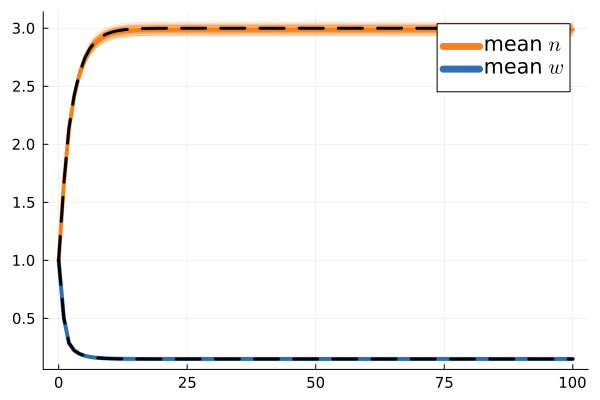

In [16]:
fwd_uq_a.trajectories

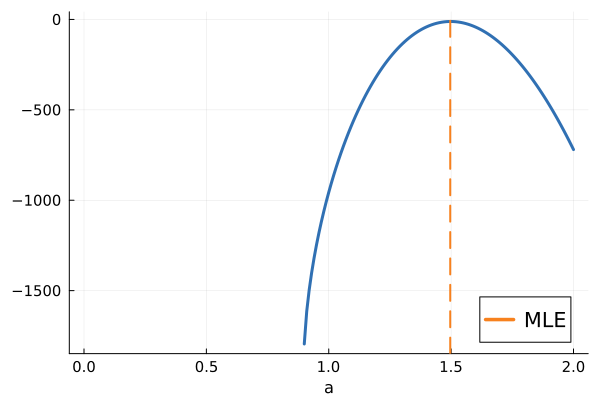

In [17]:
analyze_ll(result_infer_a.mle, prm_keys, hprm, -2000, t_fixed=t_fixed)

## Infer two parameters

In [18]:
# determine which parameters are inferred
a_true = 1.5
m_true = 0.45
prm_keys = [:a, :m]

# further settings
t_fixed = true
hprm = Hyperprm(1.0, 1.0, a_true, m_true, 100, 0.1)

Hyperprm(1.0, 1.0, 1.5, 0.45, 100, 0.1)

In [20]:
result_infer_am = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)
fwd_uq_am = forward_uq(result_infer_am.mle, result_infer_am.cov, prm_keys, [a_true, m_true], hprm, t_fixed=t_fixed)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

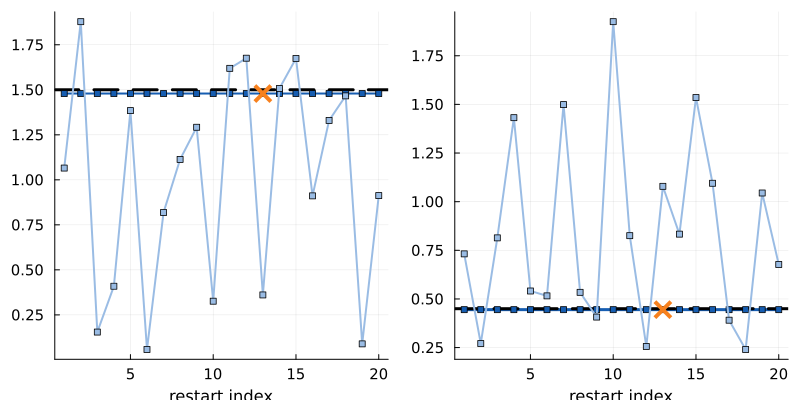

In [26]:
plot(result_infer_am.plot_mles[1], result_infer_am.plot_mles[2], legend=:false, size=(800,400))

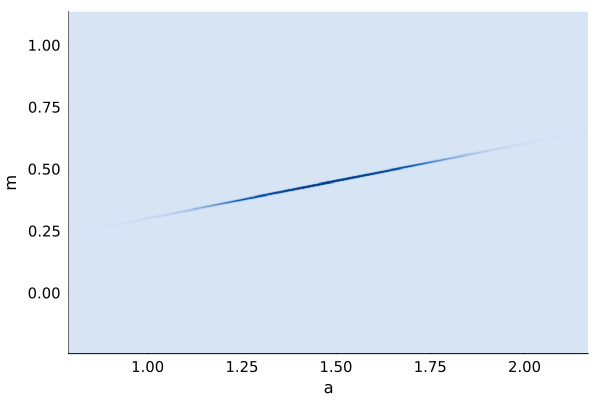

In [27]:
result_infer_am.gaussian_heatmap

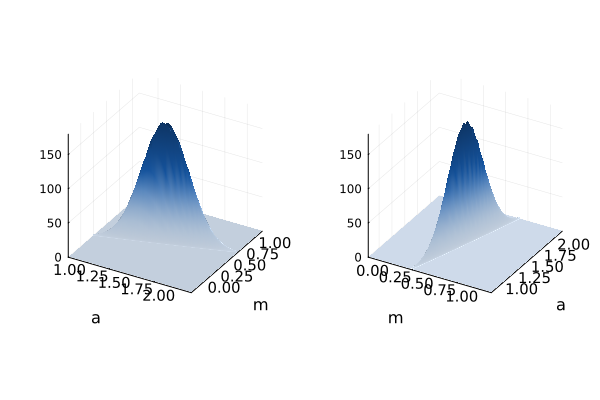

In [30]:
plot(result_infer_am.gaussian_surface[1], result_infer_am.gaussian_surface[2])

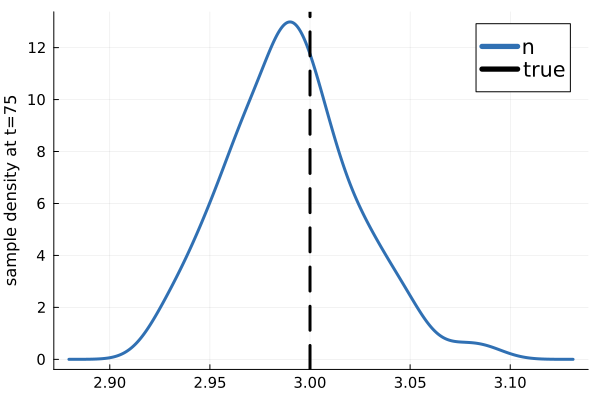

In [31]:
fwd_uq_am.sample_dens_n

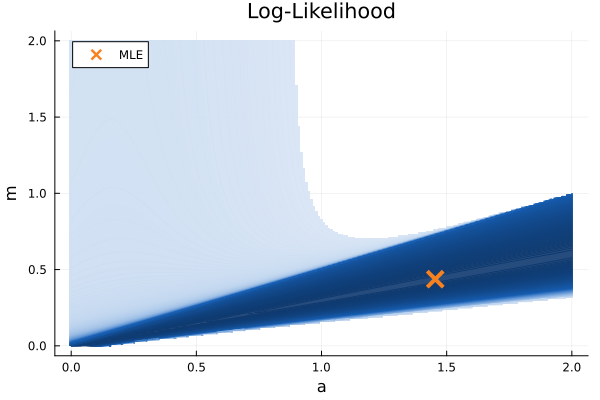

In [ ]:
analyze_ll(result_infer_am.mle, prm_keys, hprm, -4500, t_fixed=t_fixed)

## Infer when observing only stable state

In [32]:
# determine which parameters are inferred
a_true = 1.5
m_true = 0.45
prm_keys = [:a, :m]

# further settings
t_fixed = true
t_end = 200.0
obs_late = true
hprm = Hyperprm(1.0, 1.0, a_true, m_true, 100, 0.1)

Hyperprm(1.0, 1.0, 1.5, 0.45, 100, 0.1)

In [33]:
result_infer_late_am = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed, t_end=t_end, obs_late=obs_late)
fwd_uq_late_am = forward_uq(result_infer_am.mle, result_infer_am.cov, prm_keys, [a_true, m_true], hprm, t_fixed=t_fixed)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

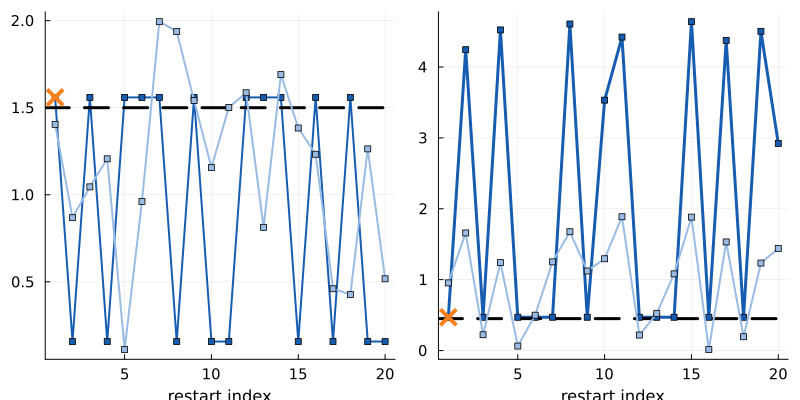

In [34]:
plot(result_infer_late_am.plot_mles[1], result_infer_late_am.plot_mles[2], legend=false, size=(800,400))

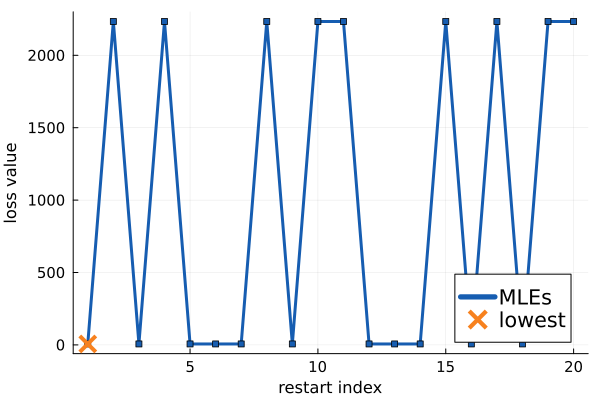

In [35]:
result_infer_late_am.plot_losses

In [36]:
result_infer_late_am.cor

2×2 Matrix{Float64}:
 1.0       0.999125
 0.999125  1.0

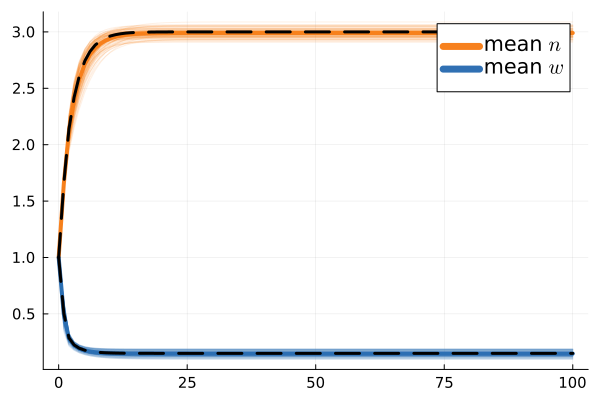

In [37]:
fwd_uq_late_am.trajectories